# Data Cleansing

## Importing Packages

In [114]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
# Initial imports

from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from imblearn.ensemble import EasyEnsembleClassifier
from sklearn.metrics import balanced_accuracy_score
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from xgboost import XGBClassifier
import xgboost
import matplotlib.pyplot as plt
import seaborn as sns


# Needed for decision tree visualization
import pydotplus
from IPython.display import Image

import warnings
warnings.filterwarnings('ignore')

## Read the CSV data file

In [3]:
file_path = Path('./Data/Telco_customer_churn.xlsx')
telco_df = pd.read_excel(file_path, sheet_name=0)
telco_df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


## Inspecting and Cleansing the Data

In [4]:
# Shape of the dataset
telco_df.shape

(7043, 33)

In [5]:
# column names
telco_df.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

Removing following collumns since it does not add any new information for the machine learning models to learn from
or it is linearly dependent with other features

In [6]:
# Removing unwanted columns
telco_df.drop(['CustomerID', 'Count', 'Country', 'State', 'Lat Long', 'Churn Label', 'Churn Score', 'CLTV', 'Churn Reason'], axis=1, inplace=True)
telco_df.columns

Index(['City', 'Zip Code', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Value'],
      dtype='object')

Renaming columns for better reference

In [7]:
# Rename columns
telco_df.rename(columns={
    'City' : 'city',
    'Zip Code' : 'zip',
    'Latitude' : 'lat',
    'Longitude' : 'long',
    'Gender' : 'gender',
    'Senior Citizen' : 'senior_citizen',
    'Partner' : 'partner',
    'Dependents' : 'dependents',
    'Tenure Months' : 'tenure',
    'Phone Service' : 'phone_service',
    'Multiple Lines' : 'multiple_lines',
    'Internet Service' : 'internet_service',
    'Online Security' : 'online_security',
    'Online Backup' : 'online_backup',
    'Device Protection' : 'device_protection',
    'Tech Support' : 'tech_support',
    'Streaming TV' : 'streaming_tv',
    'Streaming Movies' : 'streaming_movies',
    'Contract' : 'contract',
    'Paperless Billing' : 'paperless_billing',
    'Payment Method' : 'payment_method',
    'Monthly Charges' : 'monthly_charges',
    'Total Charges' : 'total_charges',
    'Churn Value' : 'churn'
}, inplace=True)

In [8]:
# Target class distribution
telco_df['churn'].value_counts()

0    5174
1    1869
Name: churn, dtype: int64

In [9]:
# Data types
telco_df.dtypes

city                  object
zip                    int64
lat                  float64
long                 float64
gender                object
senior_citizen        object
partner               object
dependents            object
tenure                 int64
phone_service         object
multiple_lines        object
internet_service      object
online_security       object
online_backup         object
device_protection     object
tech_support          object
streaming_tv          object
streaming_movies      object
contract              object
paperless_billing     object
payment_method        object
monthly_charges      float64
total_charges         object
churn                  int64
dtype: object

"Total Charges" data type is incorrect which should be numeric. So further analysing needs

In [10]:
# checking empty values
telco_df.apply(lambda _x: _x == ' ').sum()

city                  0
zip                   0
lat                   0
long                  0
gender                0
senior_citizen        0
partner               0
dependents            0
tenure                0
phone_service         0
multiple_lines        0
internet_service      0
online_security       0
online_backup         0
device_protection     0
tech_support          0
streaming_tv          0
streaming_movies      0
contract              0
paperless_billing     0
payment_method        0
monthly_charges       0
total_charges        11
churn                 0
dtype: int64

'Total Charges' column has 11 empty values

In [11]:
telco_df.loc[telco_df['total_charges'] == ' ']['churn'].value_counts()

0    11
Name: churn, dtype: int64

All the missing values are belongs to Negative class and it is the class that majority of samples belongs to, so that removing them

In [12]:
# Removing missing values
telco_df.drop(telco_df.loc[telco_df['total_charges'] == ' '].index, inplace=True)

In [13]:
# Checking null values
telco_df.isna().sum()

city                 0
zip                  0
lat                  0
long                 0
gender               0
senior_citizen       0
partner              0
dependents           0
tenure               0
phone_service        0
multiple_lines       0
internet_service     0
online_security      0
online_backup        0
device_protection    0
tech_support         0
streaming_tv         0
streaming_movies     0
contract             0
paperless_billing    0
payment_method       0
monthly_charges      0
total_charges        0
churn                0
dtype: int64

In [14]:
# Checking the data type again for total_charges
telco_df['total_charges'].dtype

dtype('O')

data type is still Object and so it is required to chage to float

In [15]:
telco_df['total_charges'] = telco_df['total_charges'].astype(float)
telco_df['total_charges'].dtype

dtype('float64')

In [16]:
# Checking negative values for all the numeric features
telco_df.apply(lambda _x: _x.dtype == float and _x < 0).sum()

0       1
1       1
2       1
3       1
4       1
       ..
7038    1
7039    1
7040    1
7041    1
7042    1
Length: 7032, dtype: int32

In [17]:
# Dropping duplicate records
telco_df.drop_duplicates(inplace=True)

In [18]:
# Checking a sample of the data
telco_df.sample(5)

,city,zip,lat,long,gender,senior_citizen,partner,dependents,tenure,phone_service,...,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
6969,Oceanside,92054,33.351059,-117.420557,Male,No,No,No,35,Yes,...,No,Yes,No,Yes,One year,Yes,Electronic check,89.20,3251.30,0
6299,Point Reyes Station,94956,38.060264,-122.830646,Female,No,Yes,Yes,34,No,...,Yes,Yes,Yes,Yes,One year,No,Mailed check,61.25,1993.20,0
3459,Moreno Valley,92553,33.923149,-117.244933,Male,No,Yes,No,28,Yes,...,Yes,No,Yes,No,Month-to-month,No,Credit card (automatic),96.60,2684.35,0
3064,Eagleville,96110,41.280341,-120.150381,Female,No,Yes,Yes,2,No,...,No,Yes,No,No,Month-to-month,No,Bank transfer (automatic),29.05,44.75,0
5761,Cardiff By The Sea,92007,33.015866,-117.272254,Male,No,No,Yes,13,Yes,...,No,No,Yes,Yes,Month-to-month,No,Credit card (automatic),66.40,831.75,0


## Save the data as a CSV file

In [19]:
telco_df.to_csv('./Data/churn_data.csv', index=False)

In [20]:
churn_data = Path("./Data/churn_data.csv")
churn_df = pd.read_csv(churn_data)
churn_df.head()


,city,zip,lat,long,gender,senior_citizen,partner,dependents,tenure,phone_service,...,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,1
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,...,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.30,1


In [25]:

churn_df.columns  
churn_df.dtypes

city                  object
zip                    int64
lat                  float64
long                 float64
gender                object
senior_citizen        object
partner               object
dependents            object
tenure                 int64
phone_service         object
multiple_lines        object
internet_service      object
online_security       object
online_backup         object
device_protection     object
tech_support          object
streaming_tv          object
streaming_movies      object
contract              object
paperless_billing     object
payment_method        object
monthly_charges      float64
total_charges        float64
churn                  int64
dtype: object

In [43]:
 # Creating an instance of label encoder
churn_binary_encoded = pd.get_dummies(churn_df, columns=['city', 'gender', 'senior_citizen', 'partner',
       'dependents', 'phone_service', 'multiple_lines',
       'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'contract', 'paperless_billing', 'payment_method'])
churn_binary_encoded.head()

,zip,lat,long,tenure,monthly_charges,total_charges,churn,city_Acampo,city_Acton,city_Adelanto,...,streaming_movies_Yes,contract_Month-to-month,contract_One year,contract_Two year,paperless_billing_No,paperless_billing_Yes,payment_method_Bank transfer (automatic),payment_method_Credit card (automatic),payment_method_Electronic check,payment_method_Mailed check
0,90003,33.964131,-118.272783,2,53.85,108.15,1,0,0,0,...,0,1,0,0,0,1,0,0,0,1
1,90005,34.059281,-118.307420,2,70.70,151.65,1,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2,90006,34.048013,-118.293953,8,99.65,820.50,1,0,0,0,...,1,1,0,0,0,1,0,0,1,0
3,90010,34.062125,-118.315709,28,104.80,3046.05,1,0,0,0,...,1,1,0,0,0,1,0,0,1,0
4,90015,34.039224,-118.266293,49,103.70,5036.30,1,0,0,0,...,1,1,0,0,0,1,1,0,0,0


In [41]:
## Saving the encoded file
encoded_path = Path("./Data/churn_encoded.csv")
churn_binary_encoded.to_csv(encoded_path, index=False)

In [47]:
## Importing the encoded dataset for analysis
churn_encode = Path("./Data/churn_encoded.csv")
churn_encoded = pd.read_csv(churn_encode)
churn_encoded.head()

,zip,lat,long,tenure,monthly_charges,total_charges,churn,city_Acampo,city_Acton,city_Adelanto,...,streaming_movies_Yes,contract_Month-to-month,contract_One year,contract_Two year,paperless_billing_No,paperless_billing_Yes,payment_method_Bank transfer (automatic),payment_method_Credit card (automatic),payment_method_Electronic check,payment_method_Mailed check
0,90003,33.964131,-118.272783,2,53.85,108.15,1,0,0,0,...,0,1,0,0,0,1,0,0,0,1
1,90005,34.059281,-118.307420,2,70.70,151.65,1,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2,90006,34.048013,-118.293953,8,99.65,820.50,1,0,0,0,...,1,1,0,0,0,1,0,0,1,0
3,90010,34.062125,-118.315709,28,104.80,3046.05,1,0,0,0,...,1,1,0,0,0,1,0,0,1,0
4,90015,34.039224,-118.266293,49,103.70,5036.30,1,0,0,0,...,1,1,0,0,0,1,1,0,0,0


## Linear Regression

In [50]:
## Defining feature set
y = churn_encoded["churn"]
X = churn_encoded.drop(columns="churn")

In [52]:
# Splitting into Train and Test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    random_state=1, 
                                                    stratify=y)
X_train.shape

(5274, 1178)

In [53]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(solver='lbfgs',
                                max_iter=200,
                                random_state=1)
classifier

LogisticRegression(max_iter=200, random_state=1)

In [54]:
classifier.fit(X_train, y_train)

LogisticRegression(max_iter=200, random_state=1)

In [55]:
print(f"Training Data Score: {classifier.score(X_train, y_train)}")
print(f"Testing Data Score: {classifier.score(X_test, y_test)}")

Training Data Score: 0.7864998103905954
Testing Data Score: 0.7770193401592719


In [56]:
predictions = classifier.predict(X_test)
results = pd.DataFrame({"Prediction": predictions, "Actual": y_test}).reset_index(drop=True)
results.head(20)

,Prediction,Actual
0,0,1
1,1,0
2,0,0
3,0,1
4,0,0
5,1,1
6,0,0
7,0,0
8,0,0
9,0,1


In [58]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, predictions)

array([[1165,  126],
       [ 266,  201]], dtype=int64)

In [59]:
from sklearn.metrics import classification_report
target_names = ["customer stayed", "customer left"]
print(classification_report(y_test, predictions, target_names=target_names))


                 precision    recall  f1-score   support

customer stayed       0.81      0.90      0.86      1291
  customer left       0.61      0.43      0.51       467

       accuracy                           0.78      1758
      macro avg       0.71      0.67      0.68      1758
   weighted avg       0.76      0.78      0.76      1758



## Random Forest

In [61]:
# Creating StandardScaler instance
scaler = StandardScaler()

In [63]:
 # Fitting Standard Scaller
X_scaler = scaler.fit(X_train)

In [64]:
# Scaling data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [65]:
## Decision Tree model

model = tree.DecisionTreeClassifier()


In [79]:
# Fitting the model
model = model.fit(X_train_scaled, y_train)

In [80]:
# Making predictions using the testing data
tree_predictions = model.predict(X_test_scaled)


In [86]:
# Calculating the confusion matrix
tree_cm = confusion_matrix(y_test, tree_predictions)
cm_df = pd.DataFrame(
    tree_cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)

# Calculating the accuracy score
tree_acc_score = accuracy_score(y_test, tree_predictions)

In [87]:
# Displaying results
print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {tree_acc_score}")
print("Classification Report")
print(classification_report(y_test, tree_predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,1064,227
Actual 1,242,225


Accuracy Score : 0.7332195676905574
Classification Report
              precision    recall  f1-score   support

           0       0.81      0.82      0.82      1291
           1       0.50      0.48      0.49       467

    accuracy                           0.73      1758
   macro avg       0.66      0.65      0.65      1758
weighted avg       0.73      0.73      0.73      1758



In [88]:
 # Create DOT data
dot_data = tree.export_graphviz(
    model, out_file=None, feature_names=X.columns, class_names=["0", "1"], filled=True
)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())

In [89]:
rf_model = RandomForestClassifier(n_estimators=500, random_state=78)

In [90]:
# Create a random forest classifier
rf_model = RandomForestClassifier(n_estimators=500, random_state=78)

In [91]:
 # Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

In [92]:
# Making predictions using the testing data
rf_predictions = rf_model.predict(X_test_scaled)

In [94]:
# Calculating the confusion matrix
rf_cm = confusion_matrix(y_test, rf_predictions)
rf_cm_df = pd.DataFrame(
    rf_cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)

# Calculating the accuracy score
rf_acc_score = accuracy_score(y_test, rf_predictions)



In [96]:
 # Displaying results
print("Confusion Matrix")
display(rf_cm_df)
print(f"Accuracy Score : {rf_acc_score}")
print("Classification Report")
print(classification_report(y_test, rf_predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,1176,115
Actual 1,240,227


Accuracy Score : 0.79806598407281
Classification Report
              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1291
           1       0.66      0.49      0.56       467

    accuracy                           0.80      1758
   macro avg       0.75      0.70      0.72      1758
weighted avg       0.79      0.80      0.79      1758



In [97]:
importances = rf_model.feature_importances_

In [98]:
 # We can sort the features by their importance
sorted(zip(rf_model.feature_importances_, X.columns), reverse=True)

[(0.07672625666619541, 'total_charges'),
 (0.07532115202828064, 'tenure'),
 (0.05886472734537451, 'monthly_charges'),
 (0.05085647836732051, 'zip'),
 (0.04975747829033583, 'long'),
 (0.04960533661138229, 'lat'),
 (0.033877619313810316, 'contract_Month-to-month'),
 (0.0201024190087451, 'online_security_No'),
 (0.019922876137756555, 'payment_method_Electronic check'),
 (0.019084101092348878, 'internet_service_Fiber optic'),
 (0.018932111178273096, 'tech_support_No'),
 (0.016369409023380126, 'contract_Two year'),
 (0.016343350915215077, 'dependents_Yes'),
 (0.01532305212601436, 'dependents_No'),
 (0.01458401694712105, 'online_backup_No'),
 (0.011664839796366767, 'internet_service_DSL'),
 (0.011415451501666282, 'online_security_Yes'),
 (0.011381834046144934, 'device_protection_No'),
 (0.011294678863488743, 'contract_One year'),
 (0.011217359267662609, 'paperless_billing_No'),
 (0.010651393742181062, 'paperless_billing_Yes'),
 (0.010629204595946209, 'gender_Female'),
 (0.010563418439543691,

## Easy Ensemble Classifier

In [104]:
# Train the IF classifier
eec_clf = EasyEnsembleClassifier(random_state=1)
eec_clf.fit(X_train, y_train)

EasyEnsembleClassifier(random_state=1)

In [107]:
# Predict and Evaluate the results
y_pred = eec_clf.predict(X_test)
balanced_accuracy_score(y_test, y_pred)

0.7522984854792776

<AxesSubplot:>

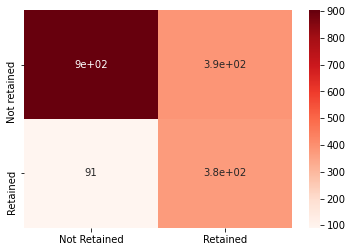

In [110]:
# Confusion metrics
eec_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), index=['Not retained', 'Retained'], columns=['Not Retained', 'Retained'])
sns.heatmap(eec_cm, annot=True, cmap='Reds')

In [112]:
# Imbalanced Classification Report
print(classification_report_imbalanced(y_test, y_pred))

                   pre       rec       spe        f1       geo       iba       sup

          0       0.91      0.70      0.81      0.79      0.75      0.56      1291
          1       0.49      0.81      0.70      0.61      0.75      0.57       467

avg / total       0.80      0.73      0.78      0.74      0.75      0.56      1758



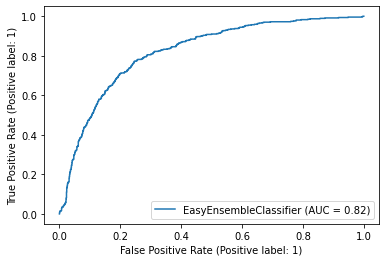

In [115]:
# plotting ROC Curve
plot_roc_curve(eec_clf, X_test, y_test)

## XGBoost Classifier

In [116]:
# Train the XGBoost classifier
xgb_clf = XGBClassifier(random_state=1, 
                        learning_rate=0.35, 
                        eval_metric='mlogloss')

xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.35, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [117]:
# Predict and Evaluate the results
y_pred = xgb_clf.predict(X_test)
balanced_accuracy_score(y_test, y_pred)

0.6983862915224326

<AxesSubplot:>

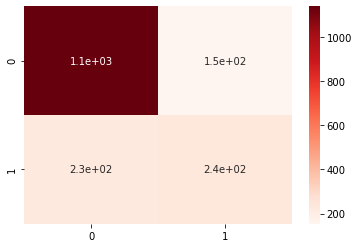

In [118]:
eec_cm = pd.DataFrame(confusion_matrix(y_test, y_pred))
sns.heatmap(eec_cm, annot=True, cmap='Reds')

In [119]:
# Imbalanced Classification Report
print(classification_report_imbalanced(y_test, y_pred))

                   pre       rec       spe        f1       geo       iba       sup

          0       0.83      0.88      0.52      0.86      0.67      0.47      1291
          1       0.61      0.52      0.88      0.56      0.67      0.44       467

avg / total       0.77      0.78      0.61      0.78      0.67      0.46      1758



In [124]:
# ROC-AUC score
roc_auc_score(y_test, y_pred)

0.6983862915224325

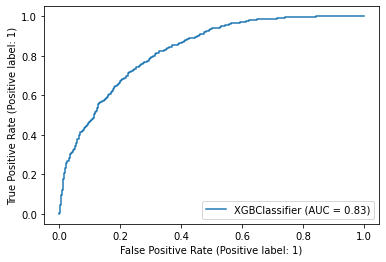

In [125]:
# plotting ROC Curve
plot_roc_curve(xgb_clf, X_test, y_test)